In [1]:
import os
import pathlib


if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists(): 
   !git clone --depth 1 https://github.com/tensorflow/models 



Cloning into 'models'...
remote: Enumerating objects: 4379, done.
remote: Counting objects: 100% (4379/4379), done.
remote: Compressing objects: 100% (3188/3188), done.
remote: Total 4379 (delta 1186), reused 3072 (delta 1117), pack-reused 0 (from 0)
Receiving objects: 100% (4379/4379), 70.03 MiB | 13.04 MiB/s, done.
Resolving deltas: 100% (1186/1186), done.


In [16]:
import subprocess
import os

research_dir = os.path.join(os.getcwd(), "research")
protos_dir = os.path.join(research_dir, "object_detection", "protos")

for proto_file in os.listdir(protos_dir):
    if proto_file.endswith(".proto"):
        proto_path = os.path.join(protos_dir, proto_file)
        subprocess.run(
            ["protoc", proto_path, "--python_out=.", "--proto_path=" + research_dir],
            cwd=research_dir,
            check=True
        )


In [19]:
import sys
import os

sys.path.append(os.path.join(os.getcwd(), "research"))
sys.path.append(os.path.join(os.getcwd(), "research", "slim"))


In [20]:
import numpy as np
import os
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
import zipfile

from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image
from IPython.display import display

In [21]:
from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

In [22]:
# patch tf1 into `utils.ops`
utils_ops.tf = tf.compat.v1

# Patch the location of gfile
tf.gfile = tf.io.gfile
    

In [23]:
def load_model(model_name):
  base_url = 'http://download.tensorflow.org/models/object_detection/'
  model_file = model_name + '.tar.gz'
  model_dir = tf.keras.utils.get_file(
    fname=model_name, 
    origin=base_url + model_file,
    untar=True)

  model_dir = pathlib.Path(model_dir)/"saved_model"

  model = tf.saved_model.load(str(model_dir))

  return model

In [24]:
# List of the strings that is used to add correct label for each box.
PATH_TO_LABELS = 'research/object_detection/data/mscoco_label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)

In [25]:
import pathlib

# If you want to test the code with your images, just add path to the images to the TEST_IMAGE_PATHS.
PATH_TO_TEST_IMAGES_DIR = pathlib.Path('research/object_detection/test_images')
TEST_IMAGE_PATHS = sorted(list(PATH_TO_TEST_IMAGES_DIR.glob("*.jpg")))
TEST_IMAGE_PATHS
     

[PosixPath('research/object_detection/test_images/image1.jpg'),
 PosixPath('research/object_detection/test_images/image2.jpg'),
 PosixPath('research/object_detection/test_images/image3.jpg'),
 PosixPath('research/object_detection/test_images/image4.jpg'),
 PosixPath('research/object_detection/test_images/image5.jpg')]

In [26]:
model_name = 'faster_rcnn_inception_resnet_v2_640x640_coco17_tpu-8'
base_url = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/'


In [27]:
import tensorflow as tf
import pathlib
import os

def load_model(model_name):
    base_url = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/'
    model_file = model_name + '.tar.gz'
    
    # Baixa e extrai o modelo
    model_dir = tf.keras.utils.get_file(
        fname=model_name,
        origin=base_url + model_file,
        untar=True
    )

    # Verifica se o arquivo 'saved_model.pb' existe
    saved_model_dir = pathlib.Path(model_dir) / "saved_model"
    if not (saved_model_dir / "saved_model.pb").exists():
        # Corrige caminho se a extração criou uma subpasta
        possible_dirs = list(pathlib.Path(model_dir).glob("**/saved_model"))
        if possible_dirs:
            saved_model_dir = possible_dirs[0]
        else:
            raise FileNotFoundError(f"Arquivo saved_model.pb não encontrado em {model_dir}")

    print(f"Carregando modelo de: {saved_model_dir}")
    model = tf.saved_model.load(str(saved_model_dir))
    return model

model_name = 'faster_rcnn_inception_resnet_v2_640x640_coco17_tpu-8'
detection_model = load_model(model_name)


Carregando modelo de: /home/guest/.keras/datasets/faster_rcnn_inception_resnet_v2_640x640_coco17_tpu-8/faster_rcnn_inception_resnet_v2_640x640_coco17_tpu-8/saved_model


In [28]:

print(detection_model.signatures['serving_default'].inputs)

[<tf.Tensor 'input_tensor:0' shape=(1, None, None, 3) dtype=uint8>, <tf.Tensor 'unknown:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_0:0' shape=(32,) dtype=float32>, <tf.Tensor 'unknown_1:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_2:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_3:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_4:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_5:0' shape=(32,) dtype=float32>, <tf.Tensor 'unknown_6:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_7:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_8:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_9:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_10:0' shape=(64,) dtype=float32>, <tf.Tensor 'unknown_11:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_12:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_13:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_14:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unkn

In [29]:
detection_model.signatures['serving_default'].output_dtypes

{'num_detections': tf.float32,
 'detection_multiclass_scores': tf.float32,
 'detection_anchor_indices': tf.float32,
 'detection_boxes': tf.float32,
 'raw_detection_boxes': tf.float32,
 'detection_scores': tf.float32,
 'detection_classes': tf.float32,
 'raw_detection_scores': tf.float32}

In [30]:
detection_model.signatures['serving_default'].output_shapes

{'num_detections': TensorShape([1]),
 'detection_multiclass_scores': TensorShape([1, 100, 91]),
 'detection_anchor_indices': TensorShape([1, 100]),
 'detection_boxes': TensorShape([1, 100, 4]),
 'raw_detection_boxes': TensorShape([1, 300, 4]),
 'detection_scores': TensorShape([1, 100]),
 'detection_classes': TensorShape([1, 100]),
 'raw_detection_scores': TensorShape([1, 300, 91])}

In [31]:
import tensorflow as tf

def run_inference_for_single_image(model, image, iou_threshold=0.5):
    image = np.asarray(image)
    input_tensor = tf.convert_to_tensor(image)
    input_tensor = input_tensor[tf.newaxis,...]

    model_fn = model.signatures['serving_default']
    output_dict = model_fn(input_tensor)

    num_detections = int(output_dict.pop('num_detections'))
    output_dict = {key:value[0, :num_detections].numpy() for key,value in output_dict.items()}
    output_dict['num_detections'] = num_detections
    output_dict['detection_classes'] = output_dict['detection_classes'].astype(np.int64)

    # --- NMS manual para sobreposição ---
    boxes = output_dict['detection_boxes']
    scores = output_dict['detection_scores']
    classes = output_dict['detection_classes']

    selected_indices = tf.image.non_max_suppression(
        boxes, scores, max_output_size=num_detections, iou_threshold=iou_threshold
    )
    
    output_dict['detection_boxes'] = boxes[selected_indices.numpy()]
    output_dict['detection_scores'] = scores[selected_indices.numpy()]
    output_dict['detection_classes'] = classes[selected_indices.numpy()]

    # Se tiver máscaras
    if 'detection_masks' in output_dict:
        detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
                  output_dict['detection_masks'], output_dict['detection_boxes'],
                   image.shape[0], image.shape[1])      
        detection_masks_reframed = tf.cast(detection_masks_reframed > 0.5, tf.uint8)
        output_dict['detection_masks_reframed'] = detection_masks_reframed.numpy()

    return output_dict


In [36]:
def show_inference(model, image_path):
  # the array based representation of the image will be used later in order to prepare the
  # result image with boxes and labels on it.
  image_np = np.array(Image.open(image_path))
  # Actual detection.
  output_dict = run_inference_for_single_image(model, image_np)
  # Visualization of the results of a detection.
  vis_util.visualize_boxes_and_labels_on_image_array(
    image_np,
    output_dict['detection_boxes'],
    output_dict['detection_classes'],
    output_dict['detection_scores'],
    category_index,
    instance_masks=output_dict.get('detection_masks_reframed', None),
    use_normalized_coordinates=True,
    line_thickness=8,
    min_score_thresh=0.3  # reduz de 0.5 para 0.3
)

  display(Image.fromarray(image_np))

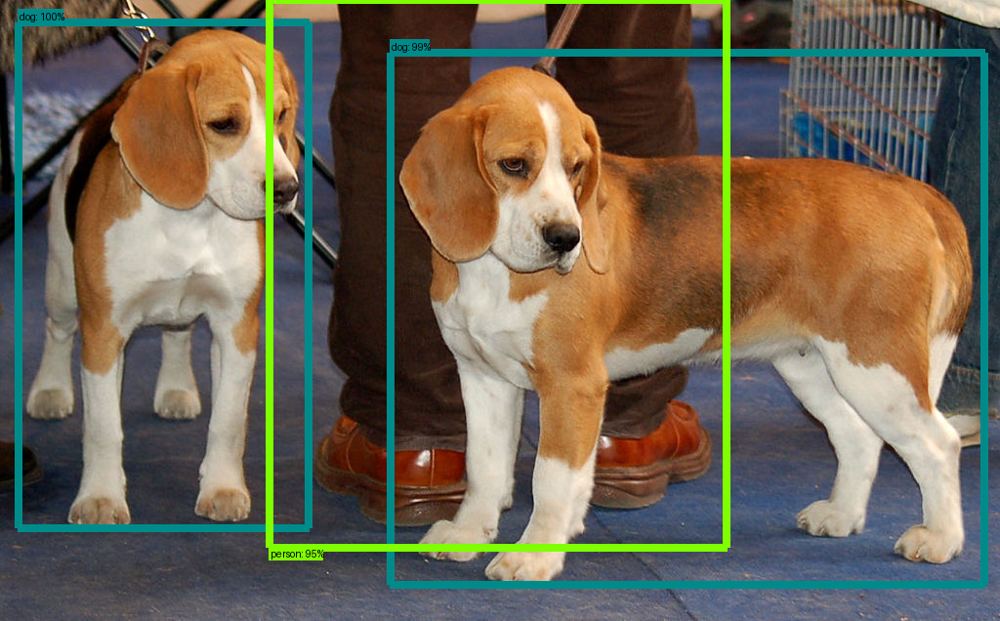

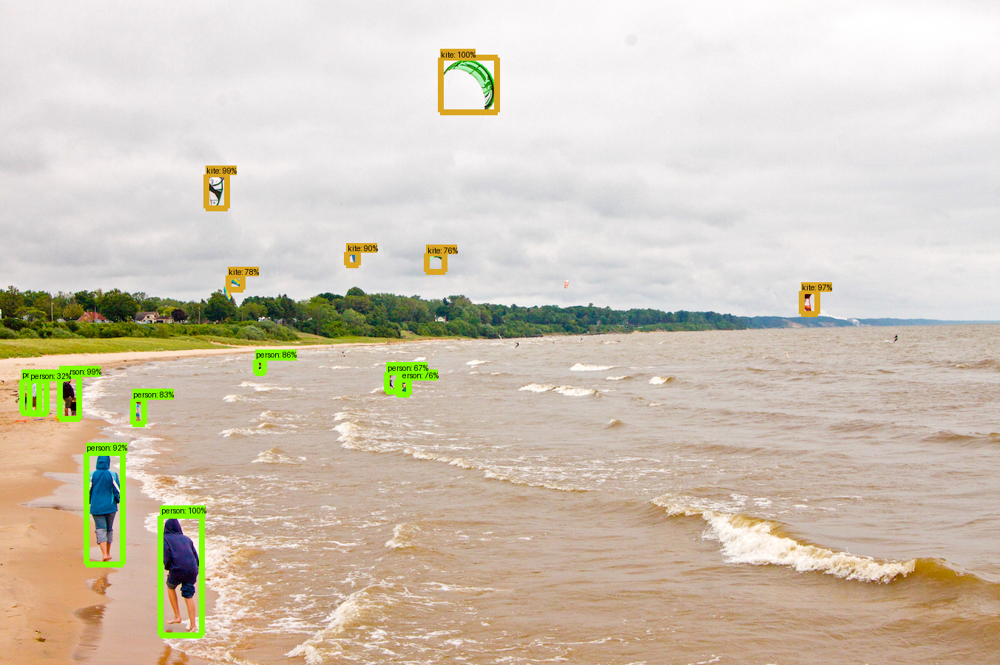

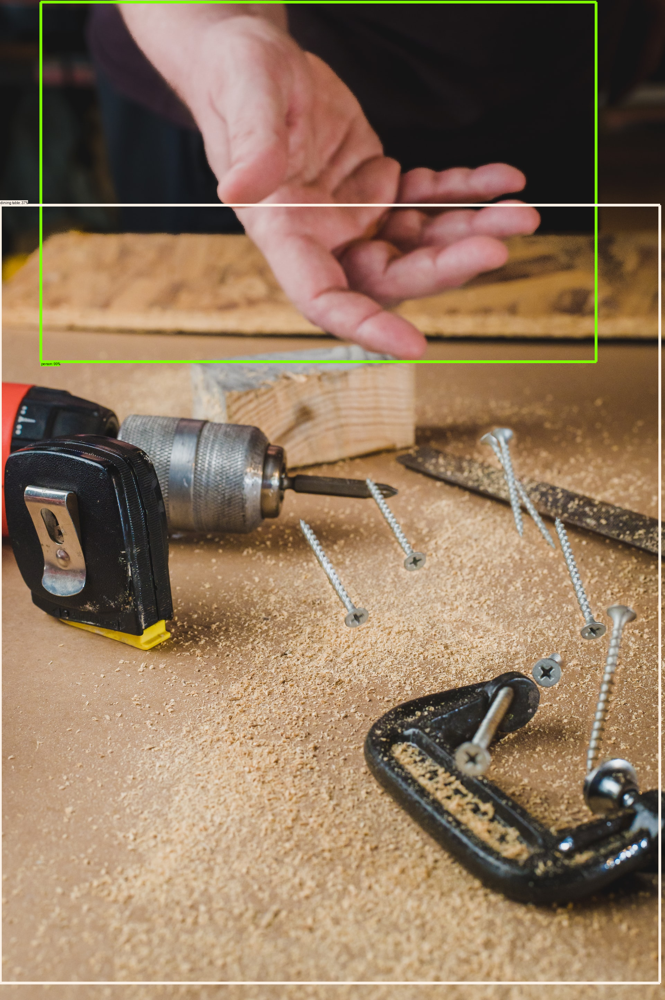

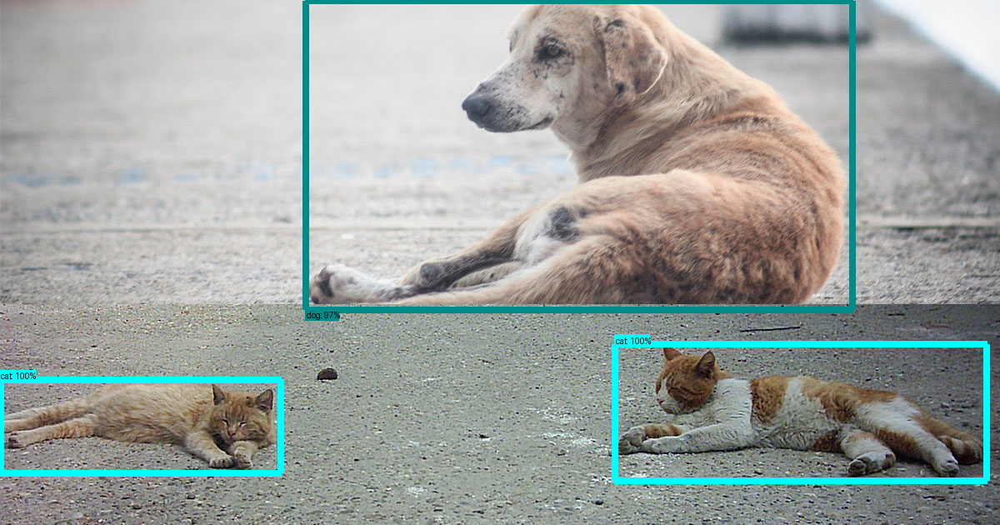

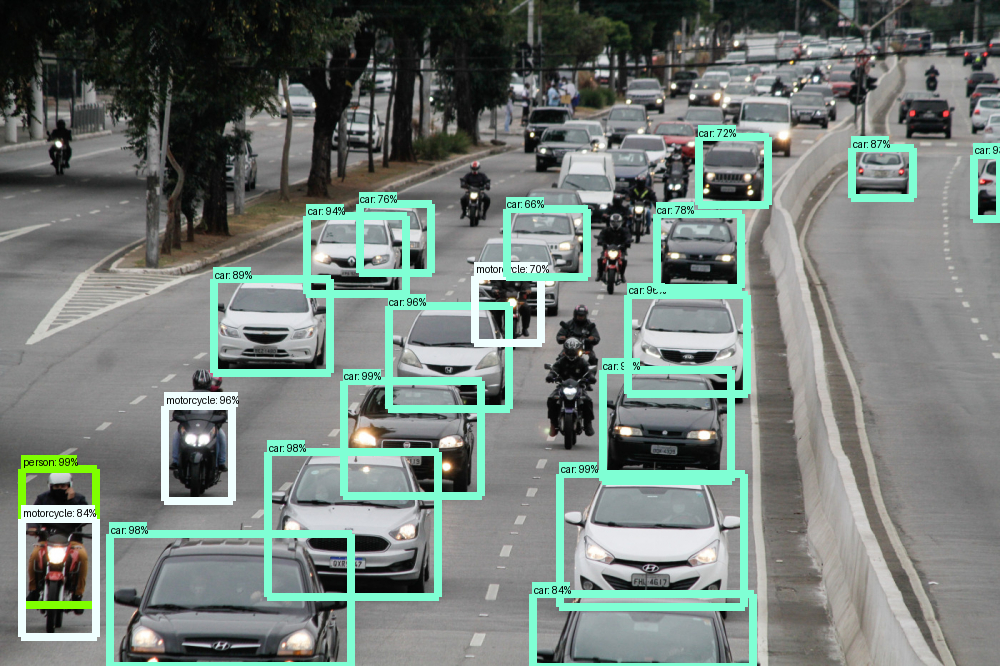

In [37]:
for image_path in TEST_IMAGE_PATHS:
  show_inference(detection_model, image_path)

In [14]:
model_name = "mask_rcnn_inception_resnet_v2_1024x1024_coco17_gpu-8"
masking_model = load_model(model_name)

Carregando modelo de: /home/guest/.keras/datasets/mask_rcnn_inception_resnet_v2_1024x1024_coco17_gpu-8/mask_rcnn_inception_resnet_v2_1024x1024_coco17_gpu-8/saved_model


In [15]:
for image_path in TEST_IMAGE_PATHS:
    show_inference(masking_model, image_path)
